### Imports

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline 
mpl.rcParams['figure.dpi'] = 300

In [3]:
from sklearn.preprocessing import Normalizer

In [4]:
from chart_studio import plotly
import plotly.figure_factory as ff

In [5]:
pd.options.display.max_rows = 4000
pd.options.display.max_columns = 4000

In [6]:
gov_arch_csv = 'data/communities_data_prepped.csv'

In [7]:
gov_df = pd.read_csv(gov_arch_csv)

In [8]:
gov_df.head()

,Name,Institutions,Mechanism,Culture/Values/Norms,Notes,Time span,Time span: Start,Time span: End,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,mechanisms_include_constitution,mechanisms_include_tribunal_court_,mechanisms_include_appeal,mechanisms_include_open_political_unit,mechanisms_include_deliberation,mechanisms_include_kingchief-as-figurehead,mechanisms_include_scrutiny_of_officials,mechanisms_include_coalition,mechanisms_include_turnover_rotation,mechanisms_include_seizing_of_property,mechanisms_include_alliance,mechanisms_include_supermajority,mechanisms_include_destruction_of_property,mechanisms_include_dreaming,mechanisms_include_ratification_acclamation_only,mechanisms_include_criticism_mocking_joking,mechanisms_include_corporal_punishment_violence_against_perpetrator,mechanisms_include_capital_punishment,mechanisms_include_temporary_position_of_power_term_limits,mechanisms_include_military_force,mechanisms_include_majority_voting,mechanisms_include_assembly_local,mechanisms_include_board_committee,mechanisms_include_magistrate_official,mechanisms_include_leader_first_among_equals,mechanisms_include_forced_labour,mechanisms_include_self-help,mechanisms_include_plurality_voting,mechanisms_include_lobbying,mechanisms_include_autocratic_leader_chief_bound,mechanisms_include_bureaucracy,mechanisms_include_popularity_,mechanisms_include_vote_by_proxy,mechanisms_include_public_meetings,mechanisms_include_remunerated_position,mechanisms_include_unanimity,mechanisms_include_heredity,mechanisms_include_handshake,mechanisms_include_dual-sex_political_system,mechanisms_include_balance_of_power,mechanisms_include_paying_damages_compensation,mechanisms_include_exit,mechanisms_include_veto,mechanisms_include_election,mechanisms_include_oath,mechanisms_include_council_central_,mechanisms_include_council_local,mechanisms_include_age_boundaries,mechanisms_include_delegation,mechanisms_include_reputational_risk,mechanisms_include_monitoring,mechanisms_include_civil_disobedience,mechanisms_include_matrilineality,mechanisms_include_induction_rite_ceremony,mechanisms_include_lottery_random_selection,mechanisms_include_voting,mechanisms_include_mandate,mechanisms_include_jury_judge,mechanisms_include_assembly_elite,mechanisms_include_life_appointment,mechanisms_include_screening_process,mechanisms_include_fines,mechanisms_include_graduated_sanctions,mechanisms_include_power_fluidity,mechanisms_include_payment_for_occupying_office,mechanisms_include_group_voting,mechanisms_include_confederacy,mechanisms_include_meritocracy,mechanisms_include_blood_relations,mechanisms_include_agenda_setting,mechanisms_include_secret_ballot,mechanisms_include_gerontocracy,mechanisms_include_consensus,mechanisms_include_petition,mechanisms_include_co-optation,mechanisms_include_quorum,mechanisms_include_negotiation,mechanisms_include_judicial_review,mechanisms_include_rule_of_law,mechanisms_include_autocratic_leader_unbound,mechanisms_include_police,mechanisms_include_mediation,mechanisms_include_property_requirement,mechanisms_include_checks_and_balances,mechanisms_include_arbitration,mechanisms_include_suspension_expulsion_ostracism_proscription,mechanisms_include_litigation,mechanisms_include_matriarchy,mechanisms_include_assembly_central,mechanisms_include_patronage_for_office,mechanisms_include_president_consul_chief_executive,mechanisms_include_representation,mechanisms_include_frequent_and_or_regular_meetings,mechanisms_include_consultation,mechanisms_include_vote_by_show_of_hands,mechanisms_include_enfranchisement,mechanisms_include_consent,mechanisms_include_divine_right,mechanisms_include_word_of_mouth,"Size: 100 - 1,000","Size: 1,001 - 10,000","Size: 10,001 - 100,000","Size: 100,001 - 1,000,000","Size: 100,000,001 - 10,000,000","Size: 10,000,000+",Size: Unknown,Geography: Africa South,Geography: Europe North,Geography: Asia Southeast,Geography: Europe West,Geography: Middle East,"Geography: Europe Southeast, Anatolia",Geo

# Mechanisms

In [9]:
mechanisms_list = [x for x in gov_df.columns if x.startswith('mechanisms')]
mechanisms_list

['mechanisms_include_constitution',
 'mechanisms_include_tribunal_court_',
 'mechanisms_include_appeal',
 'mechanisms_include_open_political_unit',
 'mechanisms_include_deliberation',
 'mechanisms_include_kingchief-as-figurehead',
 'mechanisms_include_scrutiny_of_officials',
 'mechanisms_include_coalition',
 'mechanisms_include_turnover_rotation',
 'mechanisms_include_seizing_of_property',
 'mechanisms_include_alliance',
 'mechanisms_include_supermajority',
 'mechanisms_include_destruction_of_property',
 'mechanisms_include_dreaming',
 'mechanisms_include_ratification_acclamation_only',
 'mechanisms_include_criticism_mocking_joking',
 'mechanisms_include_corporal_punishment_violence_against_perpetrator',
 'mechanisms_include_capital_punishment',
 'mechanisms_include_temporary_position_of_power_term_limits',
 'mechanisms_include_military_force',
 'mechanisms_include_majority_voting',
 'mechanisms_include_assembly_local',
 'mechanisms_include_board_committee',
 'mechanisms_include_magist

In [10]:
# mechanisms_df = gov_df[['Name'] + mechanisms_list]
mechanisms_df = gov_df[mechanisms_list]

In [11]:
mechanisms_df

,mechanisms_include_constitution,mechanisms_include_tribunal_court_,mechanisms_include_appeal,mechanisms_include_open_political_unit,mechanisms_include_deliberation,mechanisms_include_kingchief-as-figurehead,mechanisms_include_scrutiny_of_officials,mechanisms_include_coalition,mechanisms_include_turnover_rotation,mechanisms_include_seizing_of_property,mechanisms_include_alliance,mechanisms_include_supermajority,mechanisms_include_destruction_of_property,mechanisms_include_dreaming,mechanisms_include_ratification_acclamation_only,mechanisms_include_criticism_mocking_joking,mechanisms_include_corporal_punishment_violence_against_perpetrator,mechanisms_include_capital_punishment,mechanisms_include_temporary_position_of_power_term_limits,mechanisms_include_military_force,mechanisms_include_majority_voting,mechanisms_include_assembly_local,mechanisms_include_board_committee,mechanisms_include_magistrate_official,mechanisms_include_leader_first_among_equals,mechanisms_include_forced_labour,mechanisms_include_self-help,mechanisms_include_plurality_voting,mechanisms_include_lobbying,mechanisms_include_autocratic_leader_chief_bound,mechanisms_include_bureaucracy,mechanisms_include_popularity_,mechanisms_include_vote_by_proxy,mechanisms_include_public_meetings,mechanisms_include_remunerated_position,mechanisms_include_unanimity,mechanisms_include_heredity,mechanisms_include_handshake,mechanisms_include_dual-sex_political_system,mechanisms_include_balance_of_power,mechanisms_include_paying_damages_compensation,mechanisms_include_exit,mechanisms_include_veto,mechanisms_include_election,mechanisms_include_oath,mechanisms_include_council_central_,mechanisms_include_council_local,mechanisms_include_age_boundaries,mechanisms_include_delegation,mechanisms_include_reputational_risk,mechanisms_include_monitoring,mechanisms_include_civil_disobedience,mechanisms_include_matrilineality,mechanisms_include_induction_rite_ceremony,mechanisms_include_lottery_random_selection,mechanisms_include_voting,mechanisms_include_mandate,mechanisms_include_jury_judge,mechanisms_include_assembly_elite,mechanisms_include_life_appointment,mechanisms_include_screening_process,mechanisms_include_fines,mechanisms_include_graduated_sanctions,mechanisms_include_power_fluidity,mechanisms_include_payment_for_occupying_office,mechanisms_include_group_voting,mechanisms_include_confederacy,mechanisms_include_meritocracy,mechanisms_include_blood_relations,mechanisms_include_agenda_setting,mechanisms_include_secret_ballot,mechanisms_include_gerontocracy,mechanisms_include_consensus,mechanisms_include_petition,mechanisms_include_co-optation,mechanisms_include_quorum,mechanisms_include_negotiation,mechanisms_include_judicial_review,mechanisms_include_rule_of_law,mechanisms_include_autocratic_leader_unbound,mechanisms_include_police,mechanisms_include_mediation,mechanisms_include_property_requirement,mechanisms_include_checks_and_balances,mechanisms_include_arbitration,mechanisms_include_suspension_expulsion_ostracism_proscription,mechanisms_include_litigation,mechanisms_include_matriarchy,mechanisms_include_assembly_central,mechanisms_include_patronage_for_office,mechanisms_include_president_consul_chief_executive,mechanisms_include_representation,mechanisms_include_frequent_and_or_regular_meetings,mechanisms_include_consultation,mechanisms_include_vote_by_show_of_hands,mechanisms_include_enfranchisement,mechanisms_include_consent,mechanisms_include_divine_right,mechanisms_include_word_of_mouth
0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,1,

In [12]:
data_plot = gov_df.select_dtypes(include=[np.number]).dropna()

In [13]:
data_plot.describe()

,Time span: Start,Time span: End,mechanisms_include_constitution,mechanisms_include_tribunal_court_,mechanisms_include_appeal,mechanisms_include_open_political_unit,mechanisms_include_deliberation,mechanisms_include_kingchief-as-figurehead,mechanisms_include_scrutiny_of_officials,mechanisms_include_coalition,mechanisms_include_turnover_rotation,mechanisms_include_seizing_of_property,mechanisms_include_alliance,mechanisms_include_supermajority,mechanisms_include_destruction_of_property,mechanisms_include_dreaming,mechanisms_include_ratification_acclamation_only,mechanisms_include_criticism_mocking_joking,mechanisms_include_corporal_punishment_violence_against_perpetrator,mechanisms_include_capital_punishment,mechanisms_include_temporary_position_of_power_term_limits,mechanisms_include_military_force,mechanisms_include_majority_voting,mechanisms_include_assembly_local,mechanisms_include_board_committee,mechanisms_include_magistrate_official,mechanisms_include_leader_first_among_equals,mechanisms_include_forced_labour,mechanisms_include_self-help,mechanisms_include_plurality_voting,mechanisms_include_lobbying,mechanisms_include_autocratic_leader_chief_bound,mechanisms_include_bureaucracy,mechanisms_include_popularity_,mechanisms_include_vote_by_proxy,mechanisms_include_public_meetings,mechanisms_include_remunerated_position,mechanisms_include_unanimity,mechanisms_include_heredity,mechanisms_include_handshake,mechanisms_include_dual-sex_political_system,mechanisms_include_balance_of_power,mechanisms_include_paying_damages_compensation,mechanisms_include_exit,mechanisms_include_veto,mechanisms_include_election,mechanisms_include_oath,mechanisms_include_council_central_,mechanisms_include_council_local,mechanisms_include_age_boundaries,mechanisms_include_delegation,mechanisms_include_reputational_risk,mechanisms_include_monitoring,mechanisms_include_civil_disobedience,mechanisms_include_matrilineality,mechanisms_include_induction_rite_ceremony,mechanisms_include_lottery_random_selection,mechanisms_include_voting,mechanisms_include_mandate,mechanisms_include_jury_judge,mechanisms_include_assembly_elite,mechanisms_include_life_appointment,mechanisms_include_screening_process,mechanisms_include_fines,mechanisms_include_graduated_sanctions,mechanisms_include_power_fluidity,mechanisms_include_payment_for_occupying_office,mechanisms_include_group_voting,mechanisms_include_confederacy,mechanisms_include_meritocracy,mechanisms_include_blood_relations,mechanisms_include_agenda_setting,mechanisms_include_secret_ballot,mechanisms_include_gerontocracy,mechanisms_include_consensus,mechanisms_include_petition,mechanisms_include_co-optation,mechanisms_include_quorum,mechanisms_include_negotiation,mechanisms_include_judicial_review,mechanisms_include_rule_of_law,mechanisms_include_autocratic_leader_unbound,mechanisms_include_police,mechanisms_include_mediation,mechanisms_include_property_requirement,mechanisms_include_checks_and_balances,mechanisms_include_arbitration,mechanisms_include_suspension_expulsion_ostracism_proscription,mechanisms_include_litigation,mechanisms_include_matriarchy,mechanisms_include_assembly_central,mechanisms_include_patronage_for_office,mechanisms_include_president_consul_chief_executive,mechanisms_include_representation,mechanisms_include_frequent_and_or_regular_meetings,mechanisms_include_consultation,mechanisms_include_vote_by_show_of_hands,mechanisms_include_enfranchisement,mechanisms_include_consent,mechanisms_include_divine_right,mechanisms_include_word_of_mouth,"Size: 100 - 1,000","Size: 1,001 - 10,000","Size: 10,001 - 100,000","Size: 100,001 - 1,000,000","Size: 100,000,001 - 10,000,000","Size: 10,000,000+",Size: Unknown,Geography: Africa South,Geography: Europe North,Geography: Asia Southeast,Geography: Europe West,Geography: Middle East,"Geography: Europe Southeast, Anatolia",Geography: Europe South,"Geography: Central America, Mexico","Geography: Middle East, Mesopotamia, Babylonia",Geography: Africa North,Geogr

In [14]:
normalized = Normalizer().fit_transform(data_plot)

norm_df = pd.DataFrame(normalized)
norm_df.columns = data_plot.columns
norm_corr = norm_df.corr()

norm_corr

,Time span: Start,Time span: End,mechanisms_include_constitution,mechanisms_include_tribunal_court_,mechanisms_include_appeal,mechanisms_include_open_political_unit,mechanisms_include_deliberation,mechanisms_include_kingchief-as-figurehead,mechanisms_include_scrutiny_of_officials,mechanisms_include_coalition,mechanisms_include_turnover_rotation,mechanisms_include_seizing_of_property,mechanisms_include_alliance,mechanisms_include_supermajority,mechanisms_include_destruction_of_property,mechanisms_include_dreaming,mechanisms_include_ratification_acclamation_only,mechanisms_include_criticism_mocking_joking,mechanisms_include_corporal_punishment_violence_against_perpetrator,mechanisms_include_capital_punishment,mechanisms_include_temporary_position_of_power_term_limits,mechanisms_include_military_force,mechanisms_include_majority_voting,mechanisms_include_assembly_local,mechanisms_include_board_committee,mechanisms_include_magistrate_official,mechanisms_include_leader_first_among_equals,mechanisms_include_forced_labour,mechanisms_include_self-help,mechanisms_include_plurality_voting,mechanisms_include_lobbying,mechanisms_include_autocratic_leader_chief_bound,mechanisms_include_bureaucracy,mechanisms_include_popularity_,mechanisms_include_vote_by_proxy,mechanisms_include_public_meetings,mechanisms_include_remunerated_position,mechanisms_include_unanimity,mechanisms_include_heredity,mechanisms_include_handshake,mechanisms_include_dual-sex_political_system,mechanisms_include_balance_of_power,mechanisms_include_paying_damages_compensation,mechanisms_include_exit,mechanisms_include_veto,mechanisms_include_election,mechanisms_include_oath,mechanisms_include_council_central_,mechanisms_include_council_local,mechanisms_include_age_boundaries,mechanisms_include_delegation,mechanisms_include_reputational_risk,mechanisms_include_monitoring,mechanisms_include_civil_disobedience,mechanisms_include_matrilineality,mechanisms_include_induction_rite_ceremony,mechanisms_include_lottery_random_selection,mechanisms_include_voting,mechanisms_include_mandate,mechanisms_include_jury_judge,mechanisms_include_assembly_elite,mechanisms_include_life_appointment,mechanisms_include_screening_process,mechanisms_include_fines,mechanisms_include_graduated_sanctions,mechanisms_include_power_fluidity,mechanisms_include_payment_for_occupying_office,mechanisms_include_group_voting,mechanisms_include_confederacy,mechanisms_include_meritocracy,mechanisms_include_blood_relations,mechanisms_include_agenda_setting,mechanisms_include_secret_ballot,mechanisms_include_gerontocracy,mechanisms_include_consensus,mechanisms_include_petition,mechanisms_include_co-optation,mechanisms_include_quorum,mechanisms_include_negotiation,mechanisms_include_judicial_review,mechanisms_include_rule_of_law,mechanisms_include_autocratic_leader_unbound,mechanisms_include_police,mechanisms_include_mediation,mechanisms_include_property_requirement,mechanisms_include_checks_and_balances,mechanisms_include_arbitration,mechanisms_include_suspension_expulsion_ostracism_proscription,mechanisms_include_litigation,mechanisms_include_matriarchy,mechanisms_include_assembly_central,mechanisms_include_patronage_for_office,mechanisms_include_president_consul_chief_executive,mechanisms_include_representation,mechanisms_include_frequent_and_or_regular_meetings,mechanisms_include_consultation,mechanisms_include_vote_by_show_of_hands,mechanisms_include_enfranchisement,mechanisms_include_consent,mechanisms_include_divine_right,mechanisms_include_word_of_mouth,"Size: 100 - 1,000","Size: 1,001 - 10,000","Size: 10,001 - 100,000","Size: 100,001 - 1,000,000","Size: 100,000,001 - 10,000,000","Size: 10,000,000+",Size: Unknown,Geography: Africa South,Geography: Europe North,Geography: Asia Southeast,Geography: Europe West,Geography: Middle East,"Geography: Europe Southeast, Anatolia",Geography: Europe South,"Geography: Central America, Mexico","Geography: Middle East, Mesopotamia, Babylonia",Geography: Africa North,Geogr

In [15]:
mechanisms_df.dropna(how='any').corr()

,mechanisms_include_constitution,mechanisms_include_tribunal_court_,mechanisms_include_appeal,mechanisms_include_open_political_unit,mechanisms_include_deliberation,mechanisms_include_kingchief-as-figurehead,mechanisms_include_scrutiny_of_officials,mechanisms_include_coalition,mechanisms_include_turnover_rotation,mechanisms_include_seizing_of_property,mechanisms_include_alliance,mechanisms_include_supermajority,mechanisms_include_destruction_of_property,mechanisms_include_dreaming,mechanisms_include_ratification_acclamation_only,mechanisms_include_criticism_mocking_joking,mechanisms_include_corporal_punishment_violence_against_perpetrator,mechanisms_include_capital_punishment,mechanisms_include_temporary_position_of_power_term_limits,mechanisms_include_military_force,mechanisms_include_majority_voting,mechanisms_include_assembly_local,mechanisms_include_board_committee,mechanisms_include_magistrate_official,mechanisms_include_leader_first_among_equals,mechanisms_include_forced_labour,mechanisms_include_self-help,mechanisms_include_plurality_voting,mechanisms_include_lobbying,mechanisms_include_autocratic_leader_chief_bound,mechanisms_include_bureaucracy,mechanisms_include_popularity_,mechanisms_include_vote_by_proxy,mechanisms_include_public_meetings,mechanisms_include_remunerated_position,mechanisms_include_unanimity,mechanisms_include_heredity,mechanisms_include_handshake,mechanisms_include_dual-sex_political_system,mechanisms_include_balance_of_power,mechanisms_include_paying_damages_compensation,mechanisms_include_exit,mechanisms_include_veto,mechanisms_include_election,mechanisms_include_oath,mechanisms_include_council_central_,mechanisms_include_council_local,mechanisms_include_age_boundaries,mechanisms_include_delegation,mechanisms_include_reputational_risk,mechanisms_include_monitoring,mechanisms_include_civil_disobedience,mechanisms_include_matrilineality,mechanisms_include_induction_rite_ceremony,mechanisms_include_lottery_random_selection,mechanisms_include_voting,mechanisms_include_mandate,mechanisms_include_jury_judge,mechanisms_include_assembly_elite,mechanisms_include_life_appointment,mechanisms_include_screening_process,mechanisms_include_fines,mechanisms_include_graduated_sanctions,mechanisms_include_power_fluidity,mechanisms_include_payment_for_occupying_office,mechanisms_include_group_voting,mechanisms_include_confederacy,mechanisms_include_meritocracy,mechanisms_include_blood_relations,mechanisms_include_agenda_setting,mechanisms_include_secret_ballot,mechanisms_include_gerontocracy,mechanisms_include_consensus,mechanisms_include_petition,mechanisms_include_co-optation,mechanisms_include_quorum,mechanisms_include_negotiation,mechanisms_include_judicial_review,mechanisms_include_rule_of_law,mechanisms_include_autocratic_leader_unbound,mechanisms_include_police,mechanisms_include_mediation,mechanisms_include_property_requirement,mechanisms_include_checks_and_balances,mechanisms_include_arbitration,mechanisms_include_suspension_expulsion_ostracism_proscription,mechanisms_include_litigation,mechanisms_include_matriarchy,mechanisms_include_assembly_central,mechanisms_include_patronage_for_office,mechanisms_include_president_consul_chief_executive,mechanisms_include_representation,mechanisms_include_frequent_and_or_regular_meetings,mechanisms_include_consultation,mechanisms_include_vote_by_show_of_hands,mechanisms_include_enfranchisement,mechanisms_include_consent,mechanisms_include_divine_right,mechanisms_include_word_of_mouth
mechanisms_include_constitution,1.000000,0.147970,-0.094333,-0.081044,0.173994,0.244556,0.141827,-0.046065,0.100229,0.100229,-0.065653,-0.065653,0.205166,-0.081044,-0.094333,0.294792,4.404152e-02,0.294792,0.020141,-0.046065,0.258257,0.102012,-0.127925,8.773280e-03,-0.067207,-0.046065,0.324380,0.141827,-0.046065,-0.236134,0.100229,0.205166,-0.065653,0.332182,0.122980,-0.094333,0.215524,-0.046065,0.244556,0.069114,0.141827,-0.065653,0.205166,0.118095,0.244556,-0.033903,0.223221,0.141827,-0.1

In [16]:
plt.figure(figsize=(40,40))
sns.heatmap(mechanisms_df.corr())

<Axes: >

TODO: 
- sort by highest absolute value correlations 
- mechanisms x size 
- mechanisms x geography / region 
- mechanisms x time span (start, end, duration) 

TODO:
  - sort by highest correlation and only visualize those! 

In [17]:
norm_corr['Time span: Duration'].sort_values(ascending=False)

Time span: Duration                                                    1.000000
mechanisms_include_assembly_central                                    0.590497
mechanisms_include_council_central_                                    0.543707
mechanisms_include_magistrate_official                                 0.528739
Region: Europe                                                         0.524848
mechanisms_include_board_committee                                     0.379874
Geography: Europe South, Greece                                        0.373307
mechanisms_include_election                                            0.355580
Size: 100,001 - 1,000,000                                              0.351284
mechanisms_include_ratification_acclamation_only                       0.340241
mechanisms_include_delegation                                          0.332505
mechanisms_include_enfranchisement                                     0.316313
mechanisms_include_suspension_expulsion_

In [18]:
norm_corr['Time span: Duration'].sort_values(ascending=True)

Time span: Start                                                      -0.616435
Time span: End                                                        -0.332825
Region: North America                                                 -0.247063
mechanisms_include_council_local                                      -0.221089
mechanisms_include_kingchief-as-figurehead                            -0.214505
Geography: Asia Southeast                                             -0.203692
mechanisms_include_matrilineality                                     -0.200422
mechanisms_include_dreaming                                           -0.187062
Geography: North America                                              -0.182646
mechanisms_include_gerontocracy                                       -0.177557
mechanisms_include_assembly_local                                     -0.176929
mechanisms_include_exit                                               -0.164986
mechanisms_include_reputational_risk    

In [19]:
gov_df[['Time span: Duration'] + mechanisms_list].corr()['Time span: Duration'].sort_values(ascending=True)

mechanisms_include_self-help                                          -0.239447
mechanisms_include_suspension_expulsion_ostracism_proscription        -0.201894
mechanisms_include_kingchief-as-figurehead                            -0.196310
mechanisms_include_arbitration                                        -0.194618
mechanisms_include_matrilineality                                     -0.193391
mechanisms_include_capital_punishment                                 -0.184468
mechanisms_include_criticism_mocking_joking                           -0.184468
mechanisms_include_leader_first_among_equals                          -0.176637
mechanisms_include_voting                                             -0.169843
mechanisms_include_dreaming                                           -0.161049
mechanisms_include_gerontocracy                                       -0.156501
mechanisms_include_consensus                                          -0.156479
mechanisms_include_exit                 

In [20]:
norm_corr[['Time span: Duration'] + mechanisms_list].sort_values(by='Time span: Duration', ascending=False)

,Time span: Duration,mechanisms_include_constitution,mechanisms_include_tribunal_court_,mechanisms_include_appeal,mechanisms_include_open_political_unit,mechanisms_include_deliberation,mechanisms_include_kingchief-as-figurehead,mechanisms_include_scrutiny_of_officials,mechanisms_include_coalition,mechanisms_include_turnover_rotation,mechanisms_include_seizing_of_property,mechanisms_include_alliance,mechanisms_include_supermajority,mechanisms_include_destruction_of_property,mechanisms_include_dreaming,mechanisms_include_ratification_acclamation_only,mechanisms_include_criticism_mocking_joking,mechanisms_include_corporal_punishment_violence_against_perpetrator,mechanisms_include_capital_punishment,mechanisms_include_temporary_position_of_power_term_limits,mechanisms_include_military_force,mechanisms_include_majority_voting,mechanisms_include_assembly_local,mechanisms_include_board_committee,mechanisms_include_magistrate_official,mechanisms_include_leader_first_among_equals,mechanisms_include_forced_labour,mechanisms_include_self-help,mechanisms_include_plurality_voting,mechanisms_include_lobbying,mechanisms_include_autocratic_leader_chief_bound,mechanisms_include_bureaucracy,mechanisms_include_popularity_,mechanisms_include_vote_by_proxy,mechanisms_include_public_meetings,mechanisms_include_remunerated_position,mechanisms_include_unanimity,mechanisms_include_heredity,mechanisms_include_handshake,mechanisms_include_dual-sex_political_system,mechanisms_include_balance_of_power,mechanisms_include_paying_damages_compensation,mechanisms_include_exit,mechanisms_include_veto,mechanisms_include_election,mechanisms_include_oath,mechanisms_include_council_central_,mechanisms_include_council_local,mechanisms_include_age_boundaries,mechanisms_include_delegation,mechanisms_include_reputational_risk,mechanisms_include_monitoring,mechanisms_include_civil_disobedience,mechanisms_include_matrilineality,mechanisms_include_induction_rite_ceremony,mechanisms_include_lottery_random_selection,mechanisms_include_voting,mechanisms_include_mandate,mechanisms_include_jury_judge,mechanisms_include_assembly_elite,mechanisms_include_life_appointment,mechanisms_include_screening_process,mechanisms_include_fines,mechanisms_include_graduated_sanctions,mechanisms_include_power_fluidity,mechanisms_include_payment_for_occupying_office,mechanisms_include_group_voting,mechanisms_include_confederacy,mechanisms_include_meritocracy,mechanisms_include_blood_relations,mechanisms_include_agenda_setting,mechanisms_include_secret_ballot,mechanisms_include_gerontocracy,mechanisms_include_consensus,mechanisms_include_petition,mechanisms_include_co-optation,mechanisms_include_quorum,mechanisms_include_negotiation,mechanisms_include_judicial_review,mechanisms_include_rule_of_law,mechanisms_include_autocratic_leader_unbound,mechanisms_include_police,mechanisms_include_mediation,mechanisms_include_property_requirement,mechanisms_include_checks_and_balances,mechanisms_include_arbitration,mechanisms_include_suspension_expulsion_ostracism_proscription,mechanisms_include_litigation,mechanisms_include_matriarchy,mechanisms_include_assembly_central,mechanisms_include_patronage_for_office,mechanisms_include_president_consul_chief_executive,mechanisms_include_representation,mechanisms_include_frequent_and_or_regular_meetings,mechanisms_include_consultation,mechanisms_include_vote_by_show_of_hands,mechanisms_include_enfranchisement,mechanisms_include_consent,mechanisms_include_divine_right,mechanisms_include_word_of_mouth
Time span: Duration,1.000000,0.008176,0.285891,0.237450,0.089085,0.156804,-0.214505,0.199291,-0.006809,0.170203,-0.032894,0.180691,-0.039435,-0.146758,-0.187062,0.340241,-0.040509,-0.041088,-0.041594,0.263219,0.191585,0.163369,-0.176929,0.379874,0.528739,0.080489,0.262710,-0.092600,-0.010285,0.062015,0.291662,0.228234,-0.027639,-0.108821,0.224230,0.196429,0.097499,0.009249,0.274412,-0.083349,0.244114,0.038754,-0.164986,0.201810,0.355580,0.219057,0.543707,-0.221089,0.179

In [21]:
norm_corr['Region: Africa'].sort_values(ascending=False)

Region: Africa                                                         1.000000
Geography: Africa North                                                0.858611
mechanisms_include_blood_relations                                     0.619329
mechanisms_include_tribunal_court_                                     0.536389
mechanisms_include_autocratic_leader_chief_bound                       0.482638
mechanisms_include_suspension_expulsion_ostracism_proscription         0.465106
Size: 100,001 - 1,000,000                                              0.323299
mechanisms_include_police                                              0.225721
mechanisms_include_council_central_                                    0.214848
mechanisms_include_assembly_central                                    0.212491
Geography: Africa Central                                              0.210110
mechanisms_include_payment_for_occupying_office                        0.210110
Geography: Africa West, Mid-western Nige

In [22]:
norm_corr[['Region: Africa', 'Region: Oceania']]

,Region: Africa,Region: Oceania
Time span: Start,-0.102745,0.096376
Time span: End,-0.044050,0.068000
mechanisms_include_constitution,-0.090310,-0.037784
mechanisms_include_tribunal_court_,0.536389,-0.050343
mechanisms_include_appeal,-0.037395,-0.026265
mechanisms_include_open_political_unit,0.044540,-0.022694
mechanisms_include_deliberation,-0.008882,0.086237
mechanisms_include_kingchief-as-figurehead,-0.084286,-0.035264
mechanisms_include_scrutiny_of_officials,-0.060283,-0.025221
mechanisms_include_coalition,-0.036772,-0.015385


In [23]:
norm_corr['Time span: Duration'].sort_values(ascending=True)

Time span: Start                                                      -0.616435
Time span: End                                                        -0.332825
Region: North America                                                 -0.247063
mechanisms_include_council_local                                      -0.221089
mechanisms_include_kingchief-as-figurehead                            -0.214505
Geography: Asia Southeast                                             -0.203692
mechanisms_include_matrilineality                                     -0.200422
mechanisms_include_dreaming                                           -0.187062
Geography: North America                                              -0.182646
mechanisms_include_gerontocracy                                       -0.177557
mechanisms_include_assembly_local                                     -0.176929
mechanisms_include_exit                                               -0.164986
mechanisms_include_reputational_risk    

In [24]:
gov_df[['Time span: Duration'] + mechanisms_list].corr()['Time span: Duration'].sort_values(ascending=True)

mechanisms_include_self-help                                          -0.239447
mechanisms_include_suspension_expulsion_ostracism_proscription        -0.201894
mechanisms_include_kingchief-as-figurehead                            -0.196310
mechanisms_include_arbitration                                        -0.194618
mechanisms_include_matrilineality                                     -0.193391
mechanisms_include_capital_punishment                                 -0.184468
mechanisms_include_criticism_mocking_joking                           -0.184468
mechanisms_include_leader_first_among_equals                          -0.176637
mechanisms_include_voting                                             -0.169843
mechanisms_include_dreaming                                           -0.161049
mechanisms_include_gerontocracy                                       -0.156501
mechanisms_include_consensus                                          -0.156479
mechanisms_include_exit                 

In [25]:
norm_corr[['Time span: Duration'] + mechanisms_list].sort_values(by='Time span: Duration', ascending=False)

,Time span: Duration,mechanisms_include_constitution,mechanisms_include_tribunal_court_,mechanisms_include_appeal,mechanisms_include_open_political_unit,mechanisms_include_deliberation,mechanisms_include_kingchief-as-figurehead,mechanisms_include_scrutiny_of_officials,mechanisms_include_coalition,mechanisms_include_turnover_rotation,mechanisms_include_seizing_of_property,mechanisms_include_alliance,mechanisms_include_supermajority,mechanisms_include_destruction_of_property,mechanisms_include_dreaming,mechanisms_include_ratification_acclamation_only,mechanisms_include_criticism_mocking_joking,mechanisms_include_corporal_punishment_violence_against_perpetrator,mechanisms_include_capital_punishment,mechanisms_include_temporary_position_of_power_term_limits,mechanisms_include_military_force,mechanisms_include_majority_voting,mechanisms_include_assembly_local,mechanisms_include_board_committee,mechanisms_include_magistrate_official,mechanisms_include_leader_first_among_equals,mechanisms_include_forced_labour,mechanisms_include_self-help,mechanisms_include_plurality_voting,mechanisms_include_lobbying,mechanisms_include_autocratic_leader_chief_bound,mechanisms_include_bureaucracy,mechanisms_include_popularity_,mechanisms_include_vote_by_proxy,mechanisms_include_public_meetings,mechanisms_include_remunerated_position,mechanisms_include_unanimity,mechanisms_include_heredity,mechanisms_include_handshake,mechanisms_include_dual-sex_political_system,mechanisms_include_balance_of_power,mechanisms_include_paying_damages_compensation,mechanisms_include_exit,mechanisms_include_veto,mechanisms_include_election,mechanisms_include_oath,mechanisms_include_council_central_,mechanisms_include_council_local,mechanisms_include_age_boundaries,mechanisms_include_delegation,mechanisms_include_reputational_risk,mechanisms_include_monitoring,mechanisms_include_civil_disobedience,mechanisms_include_matrilineality,mechanisms_include_induction_rite_ceremony,mechanisms_include_lottery_random_selection,mechanisms_include_voting,mechanisms_include_mandate,mechanisms_include_jury_judge,mechanisms_include_assembly_elite,mechanisms_include_life_appointment,mechanisms_include_screening_process,mechanisms_include_fines,mechanisms_include_graduated_sanctions,mechanisms_include_power_fluidity,mechanisms_include_payment_for_occupying_office,mechanisms_include_group_voting,mechanisms_include_confederacy,mechanisms_include_meritocracy,mechanisms_include_blood_relations,mechanisms_include_agenda_setting,mechanisms_include_secret_ballot,mechanisms_include_gerontocracy,mechanisms_include_consensus,mechanisms_include_petition,mechanisms_include_co-optation,mechanisms_include_quorum,mechanisms_include_negotiation,mechanisms_include_judicial_review,mechanisms_include_rule_of_law,mechanisms_include_autocratic_leader_unbound,mechanisms_include_police,mechanisms_include_mediation,mechanisms_include_property_requirement,mechanisms_include_checks_and_balances,mechanisms_include_arbitration,mechanisms_include_suspension_expulsion_ostracism_proscription,mechanisms_include_litigation,mechanisms_include_matriarchy,mechanisms_include_assembly_central,mechanisms_include_patronage_for_office,mechanisms_include_president_consul_chief_executive,mechanisms_include_representation,mechanisms_include_frequent_and_or_regular_meetings,mechanisms_include_consultation,mechanisms_include_vote_by_show_of_hands,mechanisms_include_enfranchisement,mechanisms_include_consent,mechanisms_include_divine_right,mechanisms_include_word_of_mouth
Time span: Duration,1.000000,0.008176,0.285891,0.237450,0.089085,0.156804,-0.214505,0.199291,-0.006809,0.170203,-0.032894,0.180691,-0.039435,-0.146758,-0.187062,0.340241,-0.040509,-0.041088,-0.041594,0.263219,0.191585,0.163369,-0.176929,0.379874,0.528739,0.080489,0.262710,-0.092600,-0.010285,0.062015,0.291662,0.228234,-0.027639,-0.108821,0.224230,0.196429,0.097499,0.009249,0.274412,-0.083349,0.244114,0.038754,-0.164986,0.201810,0.355580,0.219057,0.543707,-0.221089,0.179

In [26]:
norm_corr['Region: Africa'].sort_values(ascending=False)

Region: Africa                                                         1.000000
Geography: Africa North                                                0.858611
mechanisms_include_blood_relations                                     0.619329
mechanisms_include_tribunal_court_                                     0.536389
mechanisms_include_autocratic_leader_chief_bound                       0.482638
mechanisms_include_suspension_expulsion_ostracism_proscription         0.465106
Size: 100,001 - 1,000,000                                              0.323299
mechanisms_include_police                                              0.225721
mechanisms_include_council_central_                                    0.214848
mechanisms_include_assembly_central                                    0.212491
Geography: Africa Central                                              0.210110
mechanisms_include_payment_for_occupying_office                        0.210110
Geography: Africa West, Mid-western Nige

In [27]:
norm_corr[['Region: Africa', 'Region: Oceania']]

,Region: Africa,Region: Oceania
Time span: Start,-0.102745,0.096376
Time span: End,-0.044050,0.068000
mechanisms_include_constitution,-0.090310,-0.037784
mechanisms_include_tribunal_court_,0.536389,-0.050343
mechanisms_include_appeal,-0.037395,-0.026265
mechanisms_include_open_political_unit,0.044540,-0.022694
mechanisms_include_deliberation,-0.008882,0.086237
mechanisms_include_kingchief-as-figurehead,-0.084286,-0.035264
mechanisms_include_scrutiny_of_officials,-0.060283,-0.025221
mechanisms_include_coalition,-0.036772,-0.015385


In [28]:
mechanisms_corr_df = norm_corr[mechanisms_list]

In [29]:
mechanisms_corr_df

,mechanisms_include_constitution,mechanisms_include_tribunal_court_,mechanisms_include_appeal,mechanisms_include_open_political_unit,mechanisms_include_deliberation,mechanisms_include_kingchief-as-figurehead,mechanisms_include_scrutiny_of_officials,mechanisms_include_coalition,mechanisms_include_turnover_rotation,mechanisms_include_seizing_of_property,mechanisms_include_alliance,mechanisms_include_supermajority,mechanisms_include_destruction_of_property,mechanisms_include_dreaming,mechanisms_include_ratification_acclamation_only,mechanisms_include_criticism_mocking_joking,mechanisms_include_corporal_punishment_violence_against_perpetrator,mechanisms_include_capital_punishment,mechanisms_include_temporary_position_of_power_term_limits,mechanisms_include_military_force,mechanisms_include_majority_voting,mechanisms_include_assembly_local,mechanisms_include_board_committee,mechanisms_include_magistrate_official,mechanisms_include_leader_first_among_equals,mechanisms_include_forced_labour,mechanisms_include_self-help,mechanisms_include_plurality_voting,mechanisms_include_lobbying,mechanisms_include_autocratic_leader_chief_bound,mechanisms_include_bureaucracy,mechanisms_include_popularity_,mechanisms_include_vote_by_proxy,mechanisms_include_public_meetings,mechanisms_include_remunerated_position,mechanisms_include_unanimity,mechanisms_include_heredity,mechanisms_include_handshake,mechanisms_include_dual-sex_political_system,mechanisms_include_balance_of_power,mechanisms_include_paying_damages_compensation,mechanisms_include_exit,mechanisms_include_veto,mechanisms_include_election,mechanisms_include_oath,mechanisms_include_council_central_,mechanisms_include_council_local,mechanisms_include_age_boundaries,mechanisms_include_delegation,mechanisms_include_reputational_risk,mechanisms_include_monitoring,mechanisms_include_civil_disobedience,mechanisms_include_matrilineality,mechanisms_include_induction_rite_ceremony,mechanisms_include_lottery_random_selection,mechanisms_include_voting,mechanisms_include_mandate,mechanisms_include_jury_judge,mechanisms_include_assembly_elite,mechanisms_include_life_appointment,mechanisms_include_screening_process,mechanisms_include_fines,mechanisms_include_graduated_sanctions,mechanisms_include_power_fluidity,mechanisms_include_payment_for_occupying_office,mechanisms_include_group_voting,mechanisms_include_confederacy,mechanisms_include_meritocracy,mechanisms_include_blood_relations,mechanisms_include_agenda_setting,mechanisms_include_secret_ballot,mechanisms_include_gerontocracy,mechanisms_include_consensus,mechanisms_include_petition,mechanisms_include_co-optation,mechanisms_include_quorum,mechanisms_include_negotiation,mechanisms_include_judicial_review,mechanisms_include_rule_of_law,mechanisms_include_autocratic_leader_unbound,mechanisms_include_police,mechanisms_include_mediation,mechanisms_include_property_requirement,mechanisms_include_checks_and_balances,mechanisms_include_arbitration,mechanisms_include_suspension_expulsion_ostracism_proscription,mechanisms_include_litigation,mechanisms_include_matriarchy,mechanisms_include_assembly_central,mechanisms_include_patronage_for_office,mechanisms_include_president_consul_chief_executive,mechanisms_include_representation,mechanisms_include_frequent_and_or_regular_meetings,mechanisms_include_consultation,mechanisms_include_vote_by_show_of_hands,mechanisms_include_enfranchisement,mechanisms_include_consent,mechanisms_include_divine_right,mechanisms_include_word_of_mouth
Time span: Start,-0.108241,-0.293380,-0.217542,-0.150542,-0.096400,0.209623,-0.247590,0.072390,-0.234832,-0.121387,-0.163678,0.108214,0.133486,0.165915,-0.243532,-0.123550,-0.128502,-0.122041,-0.229780,-0.196766,-0.242971,0.140689,-0.332002,-0.483865,-0.036716,-0.183441,-0.046374,-0.142695,0.053191,-0.306676,-0.303929,0.105093,0.125295,-0.239002,-0.302253,-0.104583,-0.001241,-0.039743,0.177379,-0.132927,-0.206304,0.137040,-0.273133,-0.267037,-0.206946,-0.463056,0.239146,-0.253842,-0.198135

In [30]:
query_mechanisms_df = mechanisms_corr_df.transpose()

In [31]:
query_mechanisms_df.head()

,Time span: Start,Time span: End,mechanisms_include_constitution,mechanisms_include_tribunal_court_,mechanisms_include_appeal,mechanisms_include_open_political_unit,mechanisms_include_deliberation,mechanisms_include_kingchief-as-figurehead,mechanisms_include_scrutiny_of_officials,mechanisms_include_coalition,mechanisms_include_turnover_rotation,mechanisms_include_seizing_of_property,mechanisms_include_alliance,mechanisms_include_supermajority,mechanisms_include_destruction_of_property,mechanisms_include_dreaming,mechanisms_include_ratification_acclamation_only,mechanisms_include_criticism_mocking_joking,mechanisms_include_corporal_punishment_violence_against_perpetrator,mechanisms_include_capital_punishment,mechanisms_include_temporary_position_of_power_term_limits,mechanisms_include_military_force,mechanisms_include_majority_voting,mechanisms_include_assembly_local,mechanisms_include_board_committee,mechanisms_include_magistrate_official,mechanisms_include_leader_first_among_equals,mechanisms_include_forced_labour,mechanisms_include_self-help,mechanisms_include_plurality_voting,mechanisms_include_lobbying,mechanisms_include_autocratic_leader_chief_bound,mechanisms_include_bureaucracy,mechanisms_include_popularity_,mechanisms_include_vote_by_proxy,mechanisms_include_public_meetings,mechanisms_include_remunerated_position,mechanisms_include_unanimity,mechanisms_include_heredity,mechanisms_include_handshake,mechanisms_include_dual-sex_political_system,mechanisms_include_balance_of_power,mechanisms_include_paying_damages_compensation,mechanisms_include_exit,mechanisms_include_veto,mechanisms_include_election,mechanisms_include_oath,mechanisms_include_council_central_,mechanisms_include_council_local,mechanisms_include_age_boundaries,mechanisms_include_delegation,mechanisms_include_reputational_risk,mechanisms_include_monitoring,mechanisms_include_civil_disobedience,mechanisms_include_matrilineality,mechanisms_include_induction_rite_ceremony,mechanisms_include_lottery_random_selection,mechanisms_include_voting,mechanisms_include_mandate,mechanisms_include_jury_judge,mechanisms_include_assembly_elite,mechanisms_include_life_appointment,mechanisms_include_screening_process,mechanisms_include_fines,mechanisms_include_graduated_sanctions,mechanisms_include_power_fluidity,mechanisms_include_payment_for_occupying_office,mechanisms_include_group_voting,mechanisms_include_confederacy,mechanisms_include_meritocracy,mechanisms_include_blood_relations,mechanisms_include_agenda_setting,mechanisms_include_secret_ballot,mechanisms_include_gerontocracy,mechanisms_include_consensus,mechanisms_include_petition,mechanisms_include_co-optation,mechanisms_include_quorum,mechanisms_include_negotiation,mechanisms_include_judicial_review,mechanisms_include_rule_of_law,mechanisms_include_autocratic_leader_unbound,mechanisms_include_police,mechanisms_include_mediation,mechanisms_include_property_requirement,mechanisms_include_checks_and_balances,mechanisms_include_arbitration,mechanisms_include_suspension_expulsion_ostracism_proscription,mechanisms_include_litigation,mechanisms_include_matriarchy,mechanisms_include_assembly_central,mechanisms_include_patronage_for_office,mechanisms_include_president_consul_chief_executive,mechanisms_include_representation,mechanisms_include_frequent_and_or_regular_meetings,mechanisms_include_consultation,mechanisms_include_vote_by_show_of_hands,mechanisms_include_enfranchisement,mechanisms_include_consent,mechanisms_include_divine_right,mechanisms_include_word_of_mouth,"Size: 100 - 1,000","Size: 1,001 - 10,000","Size: 10,001 - 100,000","Size: 100,001 - 1,000,000","Size: 100,000,001 - 10,000,000","Size: 10,000,000+",Size: Unknown,Geography: Africa South,Geography: Europe North,Geography: Asia Southeast,Geography: Europe West,Geography: Middle East,"Geography: Europe Southeast, Anatolia",Geography: Europe South,"Geography: Central America, Mexico","Geography: Middle East, Mesopotamia, Babylonia",Geography: Africa North,Geogr

In [32]:
time_span_cols = ['Time span: Start', 'Time span: End', 'Time span: Duration']

In [33]:
query_mechanisms_df[time_span_cols]

,Time span: Start,Time span: End,Time span: Duration
mechanisms_include_constitution,-0.108241,-0.126313,0.008176
mechanisms_include_tribunal_court_,-0.293380,-0.235446,0.285891
mechanisms_include_appeal,-0.217542,-0.164261,0.237450
mechanisms_include_open_political_unit,-0.150542,-0.144171,0.089085
mechanisms_include_deliberation,-0.096400,-0.051877,0.156804
mechanisms_include_kingchief-as-figurehead,0.209623,0.164080,-0.214505
mechanisms_include_scrutiny_of_officials,-0.247590,-0.215716,0.199291
mechanisms_include_coalition,0.072390,0.083932,-0.006809
mechanisms_include_turnover_rotation,-0.234832,-0.212230,0.170203
mechanisms_include_seizing_of_property,-0.121387,-0.158707,-0.032894


In [34]:
def query_mech(col_name, ascending=False):
    # Return a sorted frame for a single column
    return query_mechanisms_df[col_name].sort_values(ascending=ascending)

In [35]:
query_mechanisms_df['Time span: Start'].sort_values(ascending=False)

mechanisms_include_council_local                                       0.239146
mechanisms_include_representation                                      0.223211
mechanisms_include_matrilineality                                      0.220732
mechanisms_include_kingchief-as-figurehead                             0.209623
mechanisms_include_reputational_risk                                   0.192272
mechanisms_include_co-optation                                         0.177581
mechanisms_include_dual-sex_political_system                           0.177379
mechanisms_include_dreaming                                            0.165915
mechanisms_include_assembly_local                                      0.140689
mechanisms_include_gerontocracy                                        0.138184
mechanisms_include_exit                                                0.137040
mechanisms_include_destruction_of_property                             0.133486
mechanisms_include_meritocracy          

In [36]:
query_mech('Time span: Duration')

mechanisms_include_assembly_central                                    0.590497
mechanisms_include_council_central_                                    0.543707
mechanisms_include_magistrate_official                                 0.528739
mechanisms_include_board_committee                                     0.379874
mechanisms_include_election                                            0.355580
mechanisms_include_ratification_acclamation_only                       0.340241
mechanisms_include_delegation                                          0.332505
mechanisms_include_enfranchisement                                     0.316313
mechanisms_include_suspension_expulsion_ostracism_proscription         0.310907
mechanisms_include_rule_of_law                                         0.292652
mechanisms_include_autocratic_leader_chief_bound                       0.291662
mechanisms_include_tribunal_court_                                     0.285891
mechanisms_include_handshake            

In [37]:
query_mech('Time span: Duration', ascending=True)

mechanisms_include_council_local                                      -0.221089
mechanisms_include_kingchief-as-figurehead                            -0.214505
mechanisms_include_matrilineality                                     -0.200422
mechanisms_include_dreaming                                           -0.187062
mechanisms_include_gerontocracy                                       -0.177557
mechanisms_include_assembly_local                                     -0.176929
mechanisms_include_exit                                               -0.164986
mechanisms_include_reputational_risk                                  -0.150779
mechanisms_include_destruction_of_property                            -0.146758
mechanisms_include_co-optation                                        -0.145820
mechanisms_include_power_fluidity                                     -0.118110
mechanisms_include_negotiation                                        -0.113400
mechanisms_include_matriarchy           

/var/folders/v7/8x_7ty4j3m76hgg7tncks_kc0000gn/T/ipykernel_83364/643833347.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(norm_corr, dtype=np.bool))


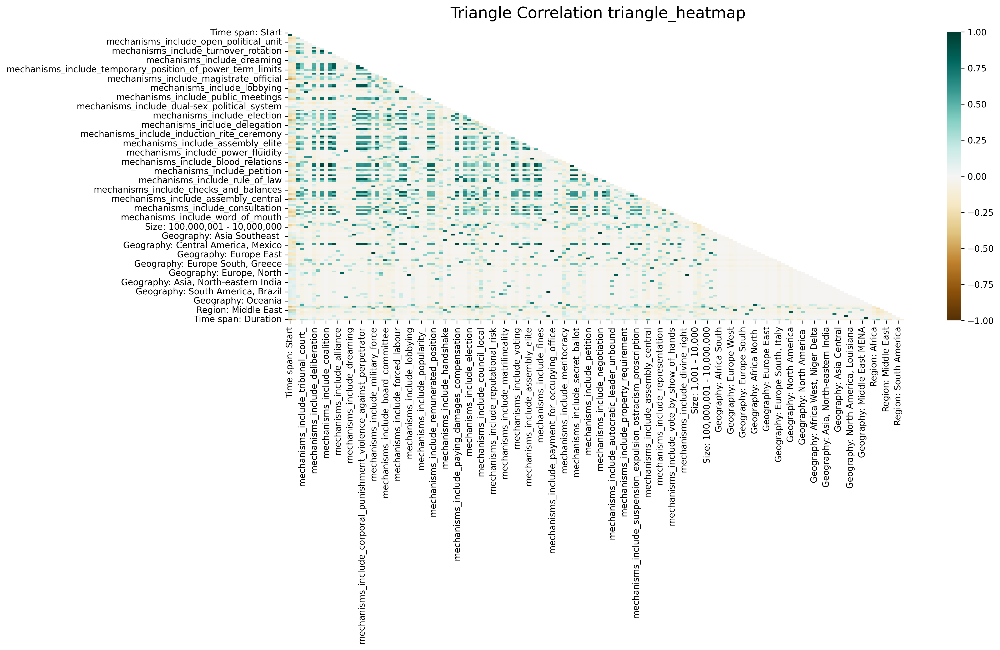

<Figure size 1920x1440 with 0 Axes>

In [38]:
plt.figure(figsize=(16, 6))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(norm_corr, dtype=np.bool))

triangle_heatmap = sns.heatmap(norm_corr, mask=mask, vmin=-1, vmax=1, annot=False, cmap='BrBG')
triangle_heatmap.set_title('Triangle Correlation triangle_heatmap', fontdict={'fontsize':18}, pad=16);

plt.show()
plt.savefig('triangle_corr.png')

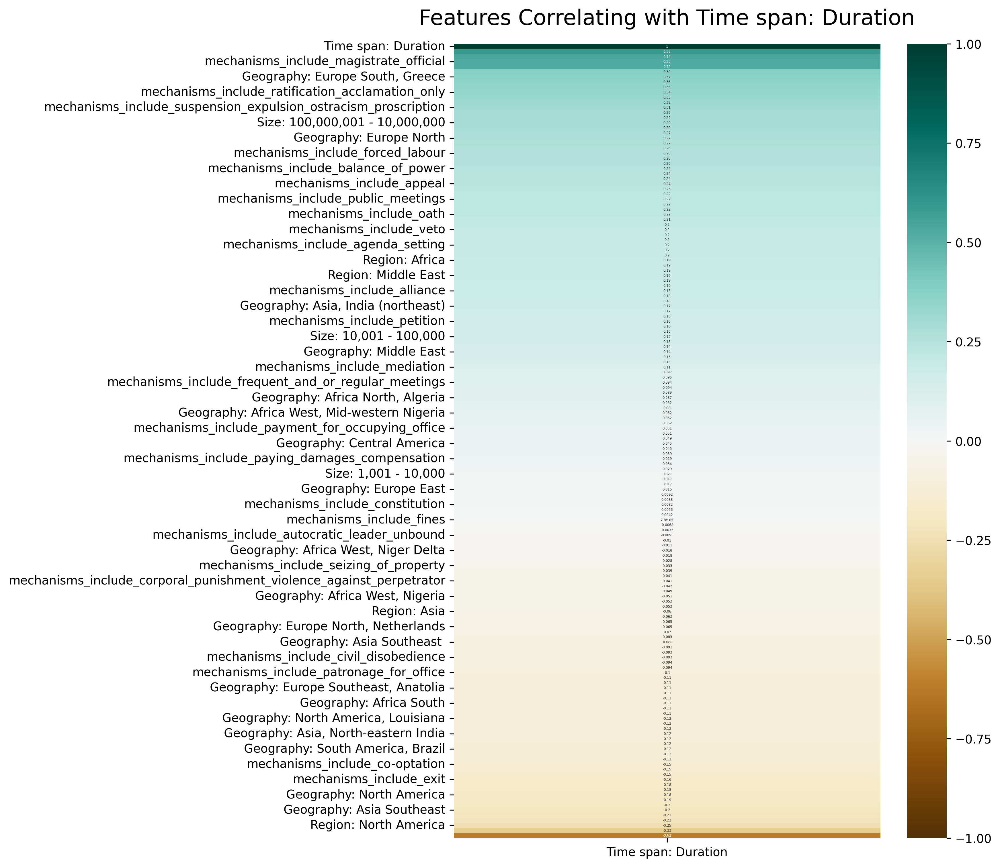

In [39]:
plt.figure(figsize=(8, 12))

heatmap = sns.heatmap(
    norm_corr[['Time span: Duration']].dropna().sort_values(
        by='Time span: Duration', 
        ascending=False), 
    vmin=-1, 
    vmax=1, 
    annot=True, 
    annot_kws={"size": 35 / np.sqrt(len(norm_corr))},
    cmap='BrBG')

heatmap.set_title('Features Correlating with Time span: Duration', fontdict={'fontsize':18}, pad=16);